# Cloning the repository

In [ ]:
!git clone https://github.com/brunoaugustoam/MorphologyAnalysisFromSegmentation.git

!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_loader.py /content/
!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_seg.py /content/
!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/plots.py /content/


fatal: destination path 'MorphologyAnalysisFromSegmentation' already exists and is not an empty directory.
mv: cannot stat '/content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_loader.py': No such file or directory
mv: cannot stat '/content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_seg.py': No such file or directory
mv: cannot stat '/content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/plots.py': No such file or directory


In [ ]:
from particle_seg import *
from particle_loader import *
from plots import *

import os
import pandas as pd

ratio = 300/68

# Settinng the Segment Anything Model to run on Colab or localy

In [ ]:
using_colab = True
if using_colab:

    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    if os.path.exists('/content/sam_vit_h_4b8939.pth'):
      print('ok')
    else:
      !{sys.executable} -m pip install opencv-python matplotlib
      !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

      !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth



PyTorch version: 2.1.0+cu121
Torchvision version: 0.16.0+cu121
CUDA is available: True
ok


# Loading data

Image indexes:

* 124: Tirmer particle

* 116: Dumbbell particle

* 59: Sphere particle

In [ ]:
img_idx='59'

if os.path.isdir('results'):
  print('ok')
else:
  !mkdir results

save_path = os.path.join(os.getcwd(),'results')
save_path

ok


'/content/results'

In [ ]:
data_path = os.path.join(os.getcwd(),'MorphologyAnalysisFromSegmentation', 'Dataset', 'SEM')

img_set = Particle_Dataset(root =data_path,img_idx=img_idx)
print("Analinsando",img_set.__len__(),'imagens')
img_set.files

# Adjust SAM checkpoint and hiperparameters

In [ ]:
sam_checkpoint = "sam_vit_h_4b8939.pth"

device = "cuda"
model_type = "vit_h"

from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

print('ok')


ok


In [ ]:
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=36,
    pred_iou_thresh=0.80,
    stability_score_thresh=0.80,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=350,  # Requires open-cv to run post-processing
)

# Run SAM-based model and morphology analysis

0/10
Analizing particle: GM 59_20


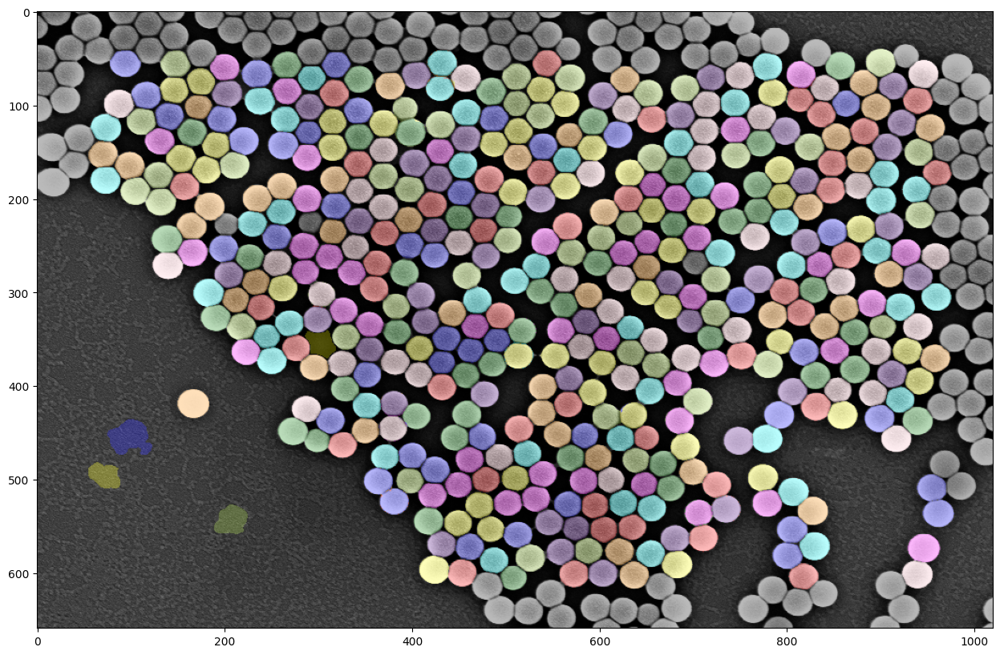

image from GM 59_20 saved!
1/10
Analizing particle: GM 59_21


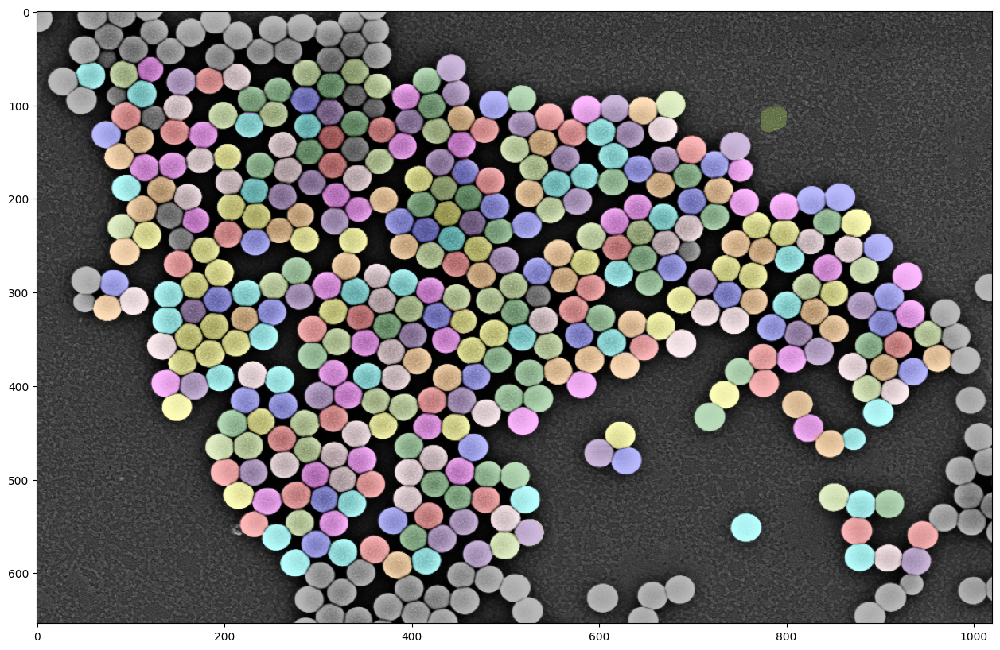

image from GM 59_21 saved!
2/10
Analizing particle: GM 59_22


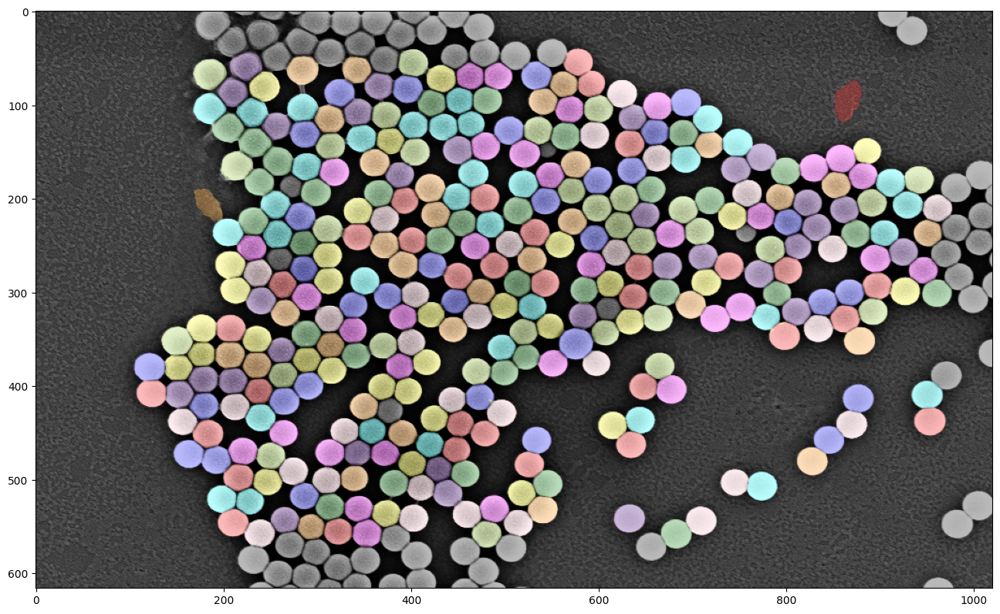

image from GM 59_22 saved!
3/10
Analizing particle: GM 59_23


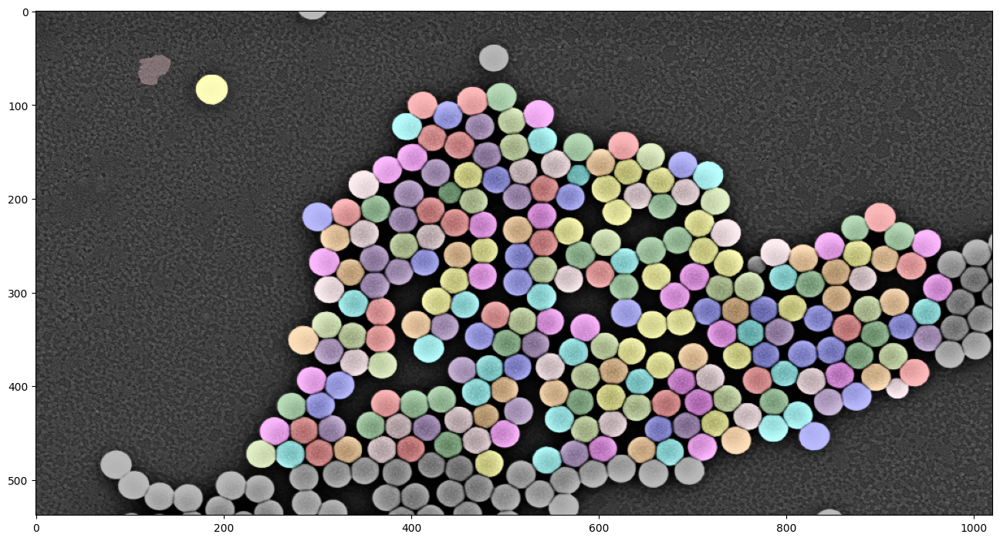

image from GM 59_23 saved!
4/10
Analizing particle: GM 59_24


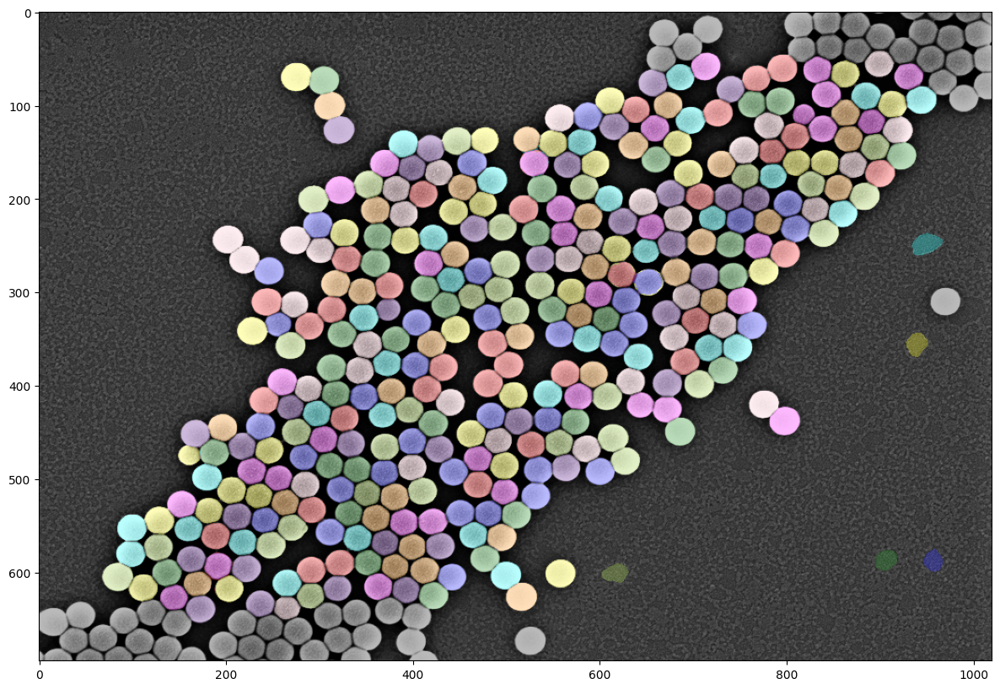

image from GM 59_24 saved!
5/10
Analizing particle: GM 59_25


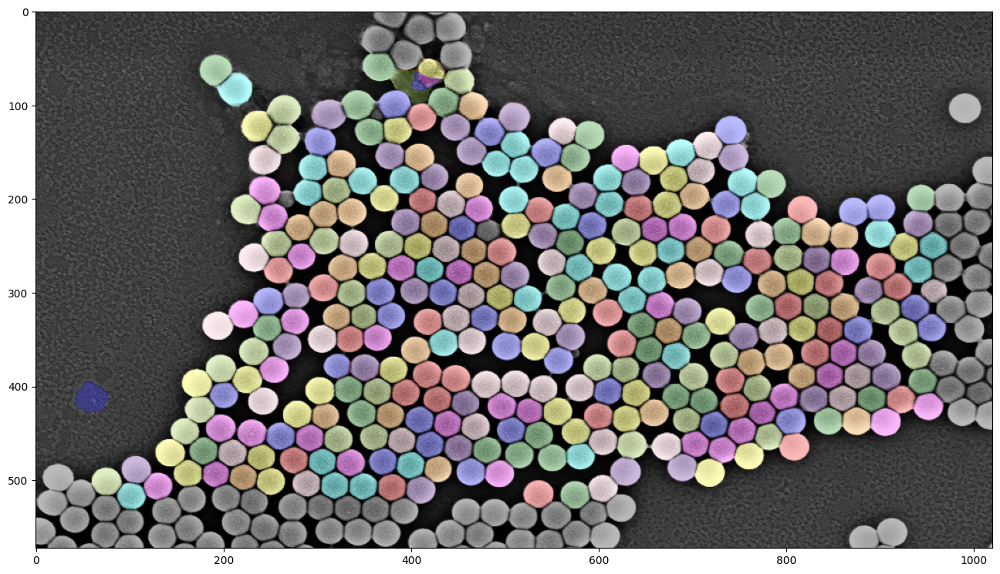

image from GM 59_25 saved!
6/10
Analizing particle: GM 59_26


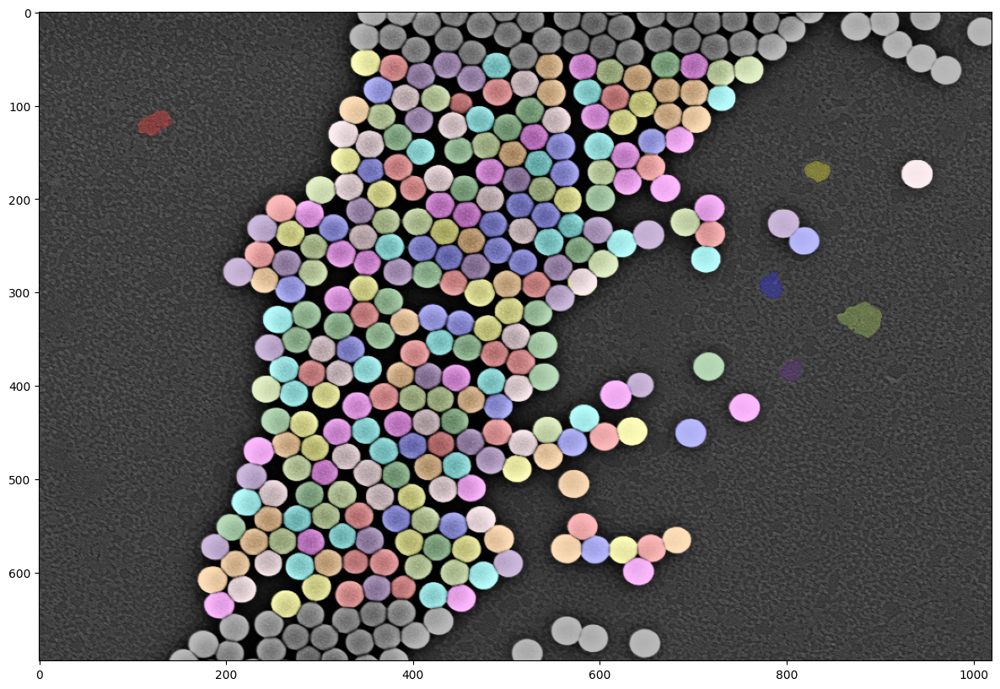

image from GM 59_26 saved!
7/10
Analizing particle: GM 59_27


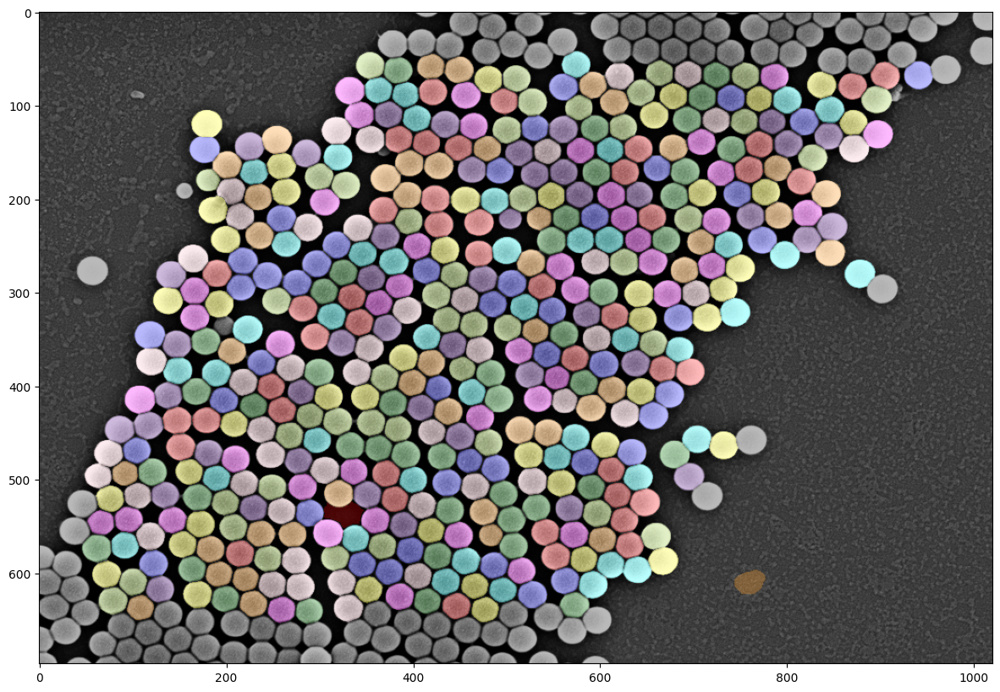

image from GM 59_27 saved!
8/10
Analizing particle: GM 59_28


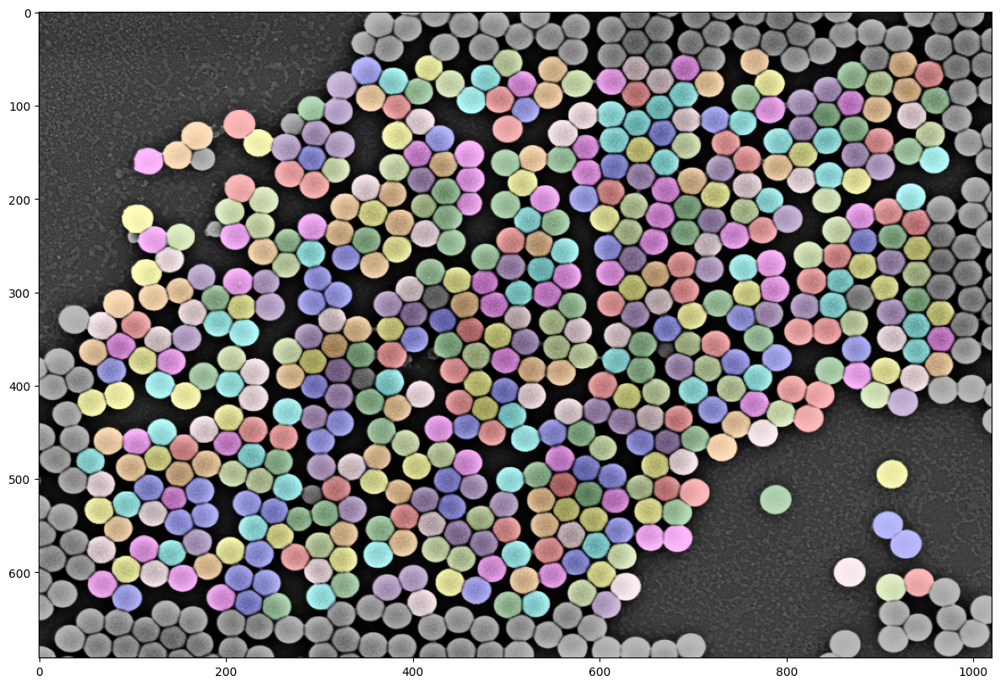

image from GM 59_28 saved!
9/10
Analizing particle: GM 59_29


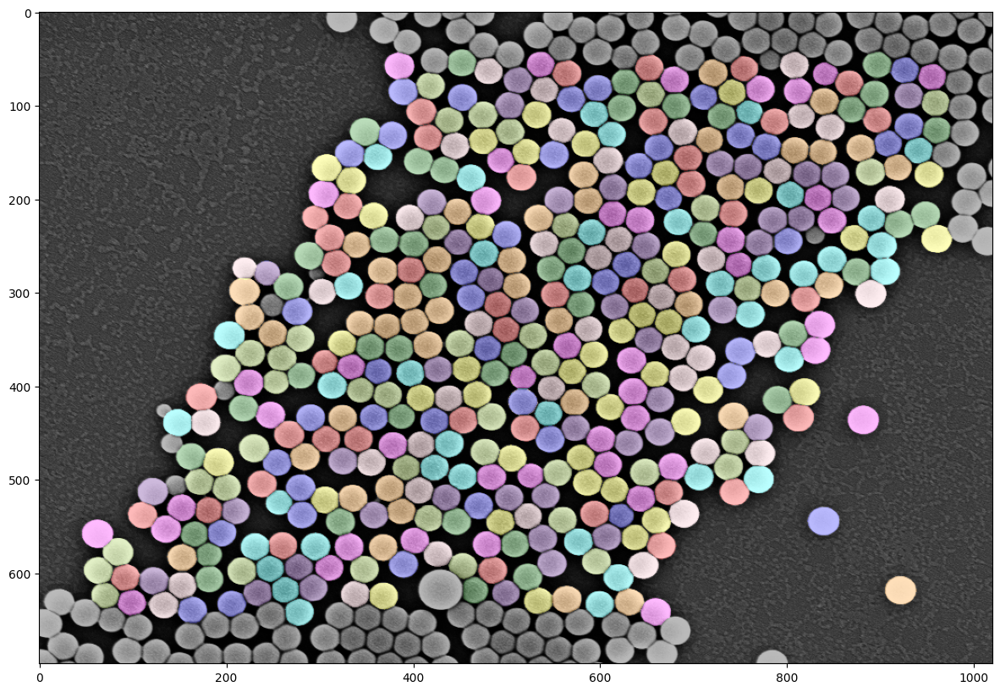

image from GM 59_29 saved!


In [11]:
for idx in range(0,img_set.__len__()):

    print(f'{idx}/{img_set.__len__()}')

    #Get image
    img, name = img_set.__getitem__(idx)
    saving_name = name.split('.')[0]
    print(f'Analizing particle: {saving_name}')

    #Apply the SAM method
    comined_mask, simple_mask, dataframe_SAM = SAM_analysis(img,mask_generator)
    dataframe_SAM['img_name'] = saving_name
    # dataframe_SAM.to_excel(f'{save_path}/df_SAM_orig_{saving_name}.xlsx')

    #Combine masks
    comb_mask = get_cob_mask_from_sam(dataframe_SAM)
    plot_seg_mask(img,comb_mask)

    #Get properties from the predicted masks
    sam_df = label_props_SAM(img,comb_mask)
    sam_df['img_name'] = saving_name

    #Save results
    sam_df.to_excel(f'{save_path}/df_analized_{saving_name}.xlsx')

    print(f'image from {saving_name} saved!')

In [16]:
save_path

'/content/results'

In [17]:
# Get the save results 
files = os.listdir(save_path)
filtered_files = sorted([ f'{save_path}/'+r for r in files if  r.split('.')[-1]=='xlsx' ])
filtered_files = sorted([r for r in filtered_files if  r.split('_')[1]=='analized' ])
filtered_files

['/content/results/df_analized_GM 59_20.xlsx',
 '/content/results/df_analized_GM 59_21.xlsx',
 '/content/results/df_analized_GM 59_22.xlsx',
 '/content/results/df_analized_GM 59_23.xlsx',
 '/content/results/df_analized_GM 59_24.xlsx',
 '/content/results/df_analized_GM 59_25.xlsx',
 '/content/results/df_analized_GM 59_26.xlsx',
 '/content/results/df_analized_GM 59_27.xlsx',
 '/content/results/df_analized_GM 59_28.xlsx',
 '/content/results/df_analized_GM 59_29.xlsx']

In [18]:
#Combine all results into one single file with all results for each particle type
init = True
for file in filtered_files:
    df_temp = pd.read_excel(file)
    if init:
        df_concat = df_temp.copy()
        init=False
    else:
        df_concat = pd.concat([df_concat,df_temp])
df_concat.to_excel(f'{save_path}/results_for_idx_{img_idx}.xlsx')

In [ ]:
df_concat